In [1]:
TRIAL_ID = '32v2_2_lumbar_beta1'
USE_TBX = False
CHECKPOINT = None #'cp_e100'
SAVE_CP = True
COEFF_REC = 1
COEFF_KLD = 1   #1e-10    # beta


In [2]:
import torch
import torch.utils.data
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset,DataLoader
import pathlib
import matplotlib.pyplot as plt
import numpy as np
import os

from utils import plot_3d_mesh, VertDataset, ResizeTo
import utils as ut
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
#Define paramaters
VOL_SIZE = 32
EPOCHS = 10
LEARNING_RATE = 1e-3
LOG_INTERVAL = 3
SAVE_EVERY = 10

N = None       # None for full dataset
BATCH_SIZE = 64
Z_DIMS = 32

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

train_path = pathlib.Path("./for_VAE/npz")
val_path = pathlib.Path("./for_VAE/val")
results_dir = pathlib.Path("./results/%s" % TRIAL_ID)
results_dir.mkdir(parents=True, exist_ok=True)

if USE_TBX:
    from tensorboardX import SummaryWriter
    log_dir = pathlib.Path('./logs/%s' % TRIAL_ID)
    writer = SummaryWriter(log_dir)

In [4]:
train_dataset = VertDataset(train_path,n=N, region='lumbar', transform=transforms.Compose([ResizeTo(VOL_SIZE),
                                                               transforms.ToTensor()]))
val_dataset = VertDataset(val_path, n=N, region='lumbar', transform=transforms.Compose([ResizeTo(VOL_SIZE),
                                                               transforms.ToTensor()]))

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
print('Number of training samples: ', len(train_dataset))
print('Number of training batches: ', len(train_loader))
print('Number of validation samples: ', len(val_dataset))

Number of training samples:  501
Number of training batches:  8
Number of validation samples:  15


In [5]:
# x = dataset[0]
# print(x.size())
# print(x.unique())
# plot_3d_mesh(x)
# del x

In [6]:
from vae32_v2_2 import Vae32 as VAE
model = VAE(z_dims=Z_DIMS, debug=False, device=device).to(device)

model.apply(ut.init_weights)       

optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [7]:
from loss import LossFunction, SoftDiceLoss
dice_loss = SoftDiceLoss()
loss_function = LossFunction(c_rec=COEFF_REC, c_kld=COEFF_KLD, loss='dice')

In [8]:
# Training setup
loss_history = list()
rec_loss_history = list()
kl_loss_history = list()
val_rec_loss_history = list()

iters=0
N_batches_train = len(train_loader)

start_epoch = 0
if CHECKPOINT is not None:
    checkpoint_path = '%s/%s' % (results_dir, CHECKPOINT)
    model, optimizer, start_epoch, loss_history, rec_loss_history, kl_loss_history, val_rec_loss_history = ut.load_checkpoint(model, optimizer,filename = checkpoint_path)
    iters = start_epoch * N_batches_train
    
    model = model.to(device)
    for state in optimizer.state.values():
        for k, v in state.items():
            if torch.is_tensor(v):
                state[k] = v.to(device)

In [9]:
import time
end_epoch = start_epoch + EPOCHS
epoch = start_epoch
for epoch in range(start_epoch, end_epoch):
################## TRAIN ########################
    start = time.time()
    model.train()
    train_loss = 0
    
    for batch_idx, data in enumerate(train_loader):
        data = data.to(device)
        optimizer.zero_grad()
        
        recon_batch, mu, logvar = model(data)
        loss, rec_loss, kl_loss = loss_function(recon_batch, data, mu, logvar)
        if USE_TBX:
            writer.add_scalar('Loss/Rec',rec_loss.detach().item(),iters)
            writer.add_scalar('Loss/KL',kl_loss.detach().item(),iters)
            writer.add_scalar('Loss/Total_Loss',loss.detach().item(),iters)
        
        loss.backward()
        loss_history.append( loss.item() )
        rec_loss_history.append( rec_loss.item() )
        kl_loss_history.append( kl_loss.item() )
        train_loss += loss.item()
        optimizer.step()
        
        if batch_idx % LOG_INTERVAL == 0:
            print('Train Epoch: {:02d} [{:04d}/{:04d} ({:.0f}%)]\tRec: {:.6f}, KLD: {:.9f}, Loss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader),
                rec_loss.item(), kl_loss.item(), loss.item() ))
        iters+=1
    #Finished one epoch        
    print('====> Epoch: {:02d} Average loss: {:.5f}'.format(
          epoch, train_loss / len(train_loader)))


    end = time.time()
    print('Training time for epoch: {:.2f}s'.format(end-start))
    print('-------------- Validation --------------')
    model.eval()
    l_sum = 0
    with torch.no_grad():
        for batch_idx, data in enumerate(val_loader):
            data = data.to(device)
            recon_batch, my, logvar = model(data)
#             rec_loss = F.binary_cross_entropy(recon_batch, data, reduction='sum')
            rec_loss = dice_loss(recon_batch, data)
            l_sum += rec_loss.item()
        val_rec_loss_history.append( l_sum / (batch_idx + 1) )
        print('\tVal rec: {:.4f}'.format(
            val_rec_loss_history[-1] ))
        
    # SAVE CHECKPOINT EVERY 10 EPOCHS
    if epoch % SAVE_EVERY == 0 and SAVE_CP:
        ut.save_checkpoint(results_dir, epoch, model, optimizer, loss_history, rec_loss_history, kl_loss_history, val_rec_loss_history)
        print('Save checkpoint after epoch ',epoch)        
    print('======================================================')

Train Epoch: 00 [0000/0501 (0%)]	Rec: 0.867638, KLD: 0.248646796, Loss: 1.116285
Train Epoch: 00 [0192/0501 (38%)]	Rec: 0.864303, KLD: 0.019149324, Loss: 0.883452
Train Epoch: 00 [0384/0501 (75%)]	Rec: 0.865093, KLD: 0.010221358, Loss: 0.875315
====> Epoch: 00 Average loss: 0.91288
Training time for epoch: 11.33s
-------------- Validation --------------
	Val rec: 0.8569
Save checkpoint after epoch  0
Train Epoch: 01 [0000/0501 (0%)]	Rec: 0.856815, KLD: 0.007109927, Loss: 0.863925
Train Epoch: 01 [0192/0501 (38%)]	Rec: 0.834048, KLD: 0.003986894, Loss: 0.838035
Train Epoch: 01 [0384/0501 (75%)]	Rec: 0.817171, KLD: 0.002416194, Loss: 0.819587
====> Epoch: 01 Average loss: 0.83698
Training time for epoch: 10.50s
-------------- Validation --------------
	Val rec: 0.8113
Train Epoch: 02 [0000/0501 (0%)]	Rec: 0.812269, KLD: 0.001990674, Loss: 0.814260
Train Epoch: 02 [0192/0501 (38%)]	Rec: 0.812352, KLD: 0.001479416, Loss: 0.813831
Train Epoch: 02 [0384/0501 (75%)]	Rec: 0.807791, KLD: 0.0009

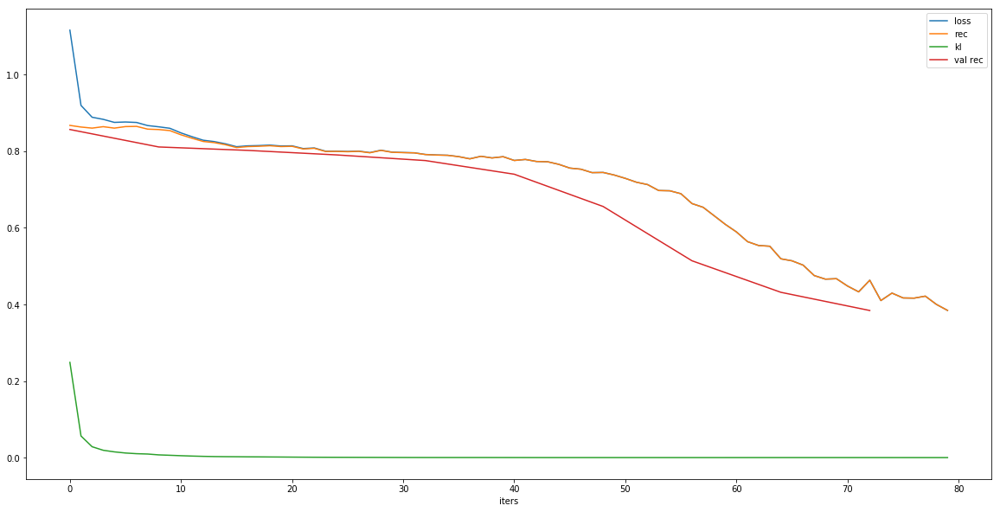

In [10]:
#plot loss
SHOW_FROM = 0
plt.figure(figsize = (20,10))
plt.plot(loss_history[SHOW_FROM:], label="loss")
plt.plot(rec_loss_history[SHOW_FROM:], label="rec")
plt.plot(kl_loss_history[SHOW_FROM:], label="kl")
plt.plot(list(range(0,iters,N_batches_train))[SHOW_FROM:],val_rec_loss_history[SHOW_FROM:], label="val rec")
plt.xlabel("iters")
plt.legend(loc='best')

In [11]:
#Save checkpoint
if EPOCHS != 0 and SAVE_CP:
    ut.save_checkpoint(results_dir, epoch, model, optimizer, loss_history, rec_loss_history, kl_loss_history, val_rec_loss_history)
    print('Save checkpoint at epoch ',epoch)

Save checkpoint at epoch  9


In [12]:
#Check reconstruction
inbatch_idx = 0
with torch.no_grad():
    x = next(iter(train_loader))
    x = x.to(device)
    recon_x, _, _ = model(x)
    
    plot_3d_mesh(x[inbatch_idx])
    plot_3d_mesh(recon_x[inbatch_idx])

In [13]:
#CHECK GENERATION RESULTS
print('Generating samples')
N_samples =8
with torch.no_grad():
    z_samples = torch.randn(N_samples, Z_DIMS).to(device)
    samples = model.decode(z_samples)
        
for x in samples:
        plot_3d_mesh(x)
#     plot_3d_mesh(ut.do_threshold(x, eps=0.3))
#     plot_3d_mesh(np.round(x))    

Generating samples


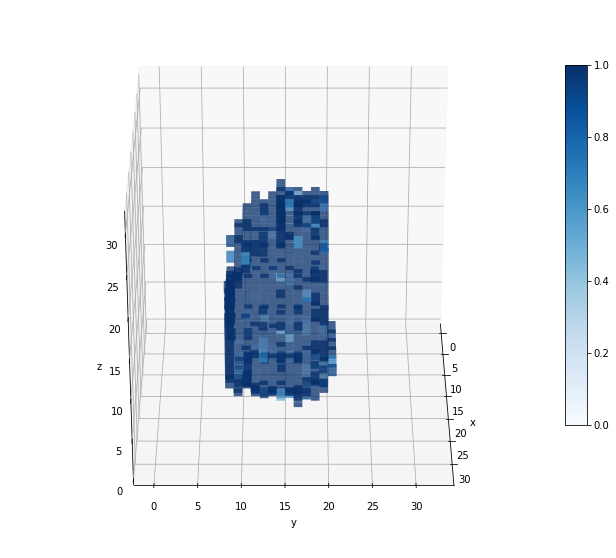

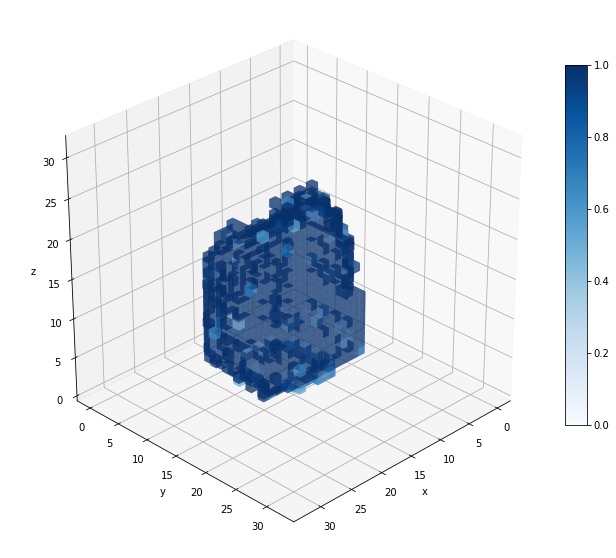

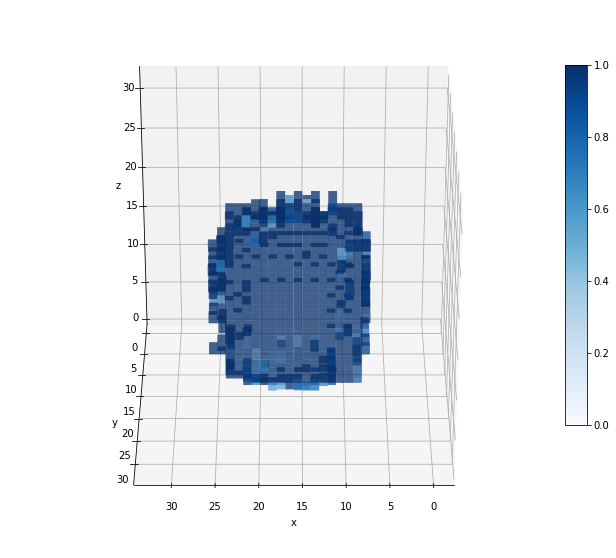

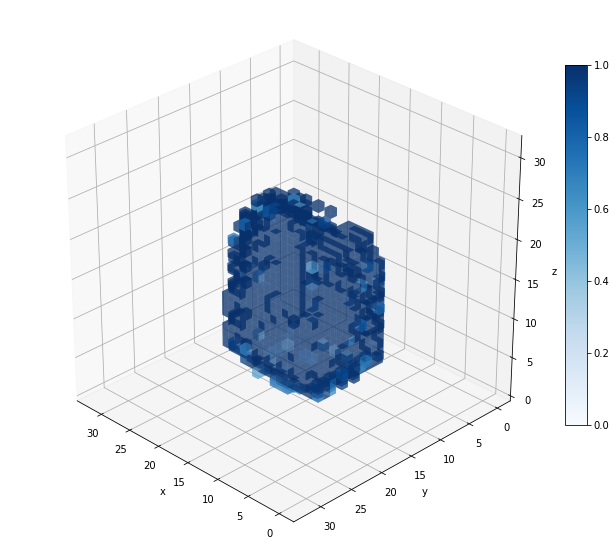

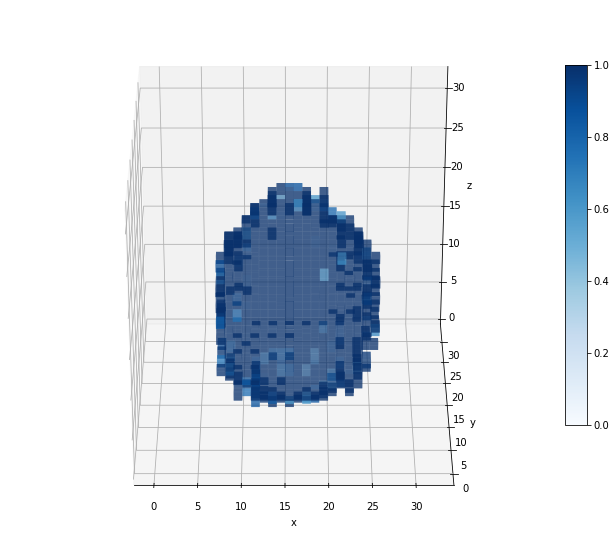

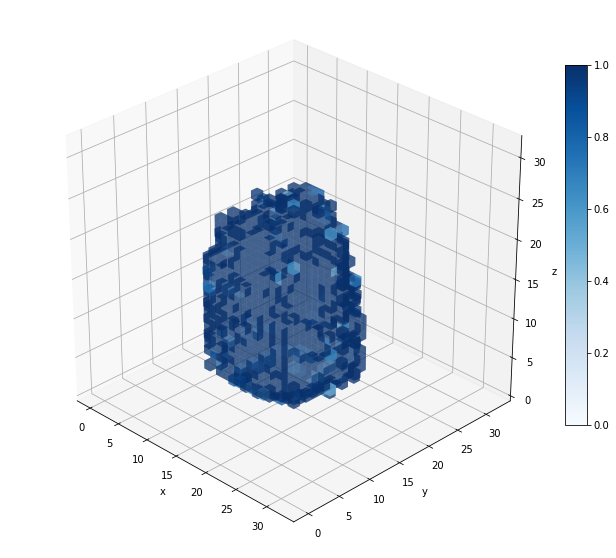

In [14]:
sample = samples[2][0]
# sample = recon_x[inbatch_idx]
thresholded = ut.do_threshold(sample, eps=0.5)
ut.plot_voxels_views(thresholded)